<a href="https://colab.research.google.com/github/ibonetc/Introduccion_DeepLearning/blob/main/IA_EjemploFiltros.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
import scipy
from scipy import signal
import matplotlib.pyplot as plt

# Filtro para buscar bordes

In [4]:
path='/content/drive/MyDrive/Fotos_Pruebas/cisnes.jpg'

In [5]:
img=cv2.imread(path)
img.shape

(2988, 5312, 3)

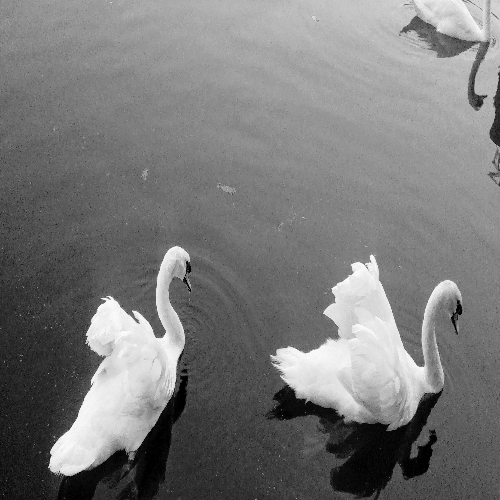

In [6]:
img=cv2.cvtColor(src=img, code=cv2.COLOR_BGR2GRAY) ## Convertir a blanco y negro
imgR=cv2.resize(img,(500,500)) ## Para achicar la imagen un poco
cv2_imshow(imgR)

In [7]:
kernel=np.array([[-1,-1,-1],[-1,8,-1],[-1,-1,-1]])
kernel

array([[-1, -1, -1],
       [-1,  8, -1],
       [-1, -1, -1]])

In [8]:
img

array([[160, 166, 165, ..., 194, 193, 202],
       [142, 148, 149, ..., 197, 194, 199],
       [117, 123, 125, ..., 200, 196, 199],
       ...,
       [ 24,  24,  23, ...,  78,  78,  76],
       [ 24,  24,  23, ...,  81,  80,  77],
       [ 24,  24,  23, ...,  83,  81,  77]], dtype=uint8)

In [9]:
res=signal.convolve2d(imgR, kernel, mode='same', boundary='fill', fillvalue=0)

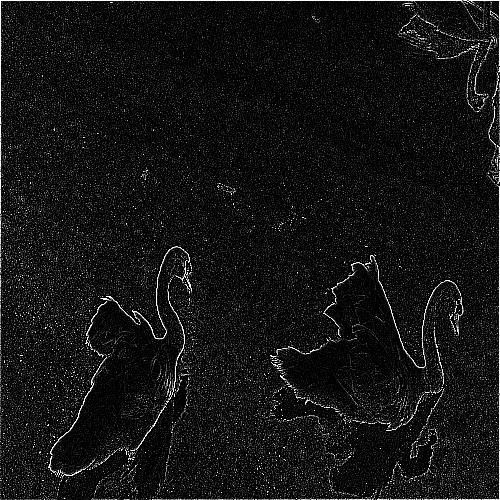

In [10]:
cv2_imshow(res)

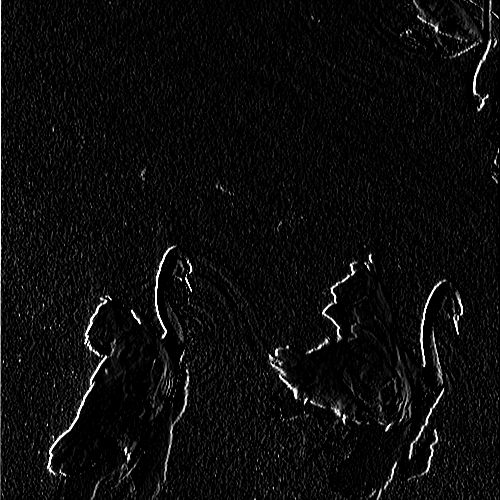

In [11]:
kernel=np.array([[1,0,-1],[2,0,-2],[1,0,-1]])
res=signal.convolve2d(imgR, kernel, mode='same', boundary='fill', fillvalue=0)
cv2_imshow(res)

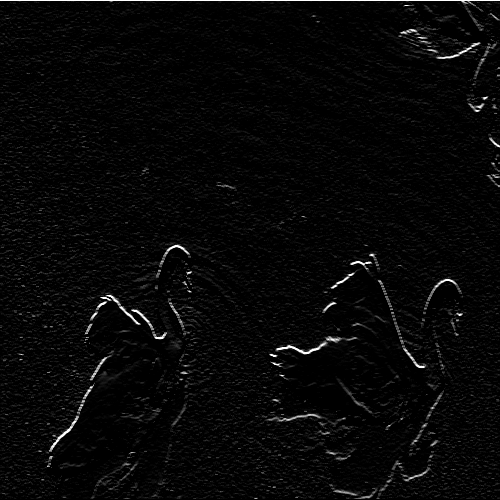

In [12]:
kernel=np.array([[1,1,1],[0,0,0],[-1,-1,-1]])
res=signal.convolve2d(imgR, kernel, mode='same', boundary='fill', fillvalue=0)
cv2_imshow(res)

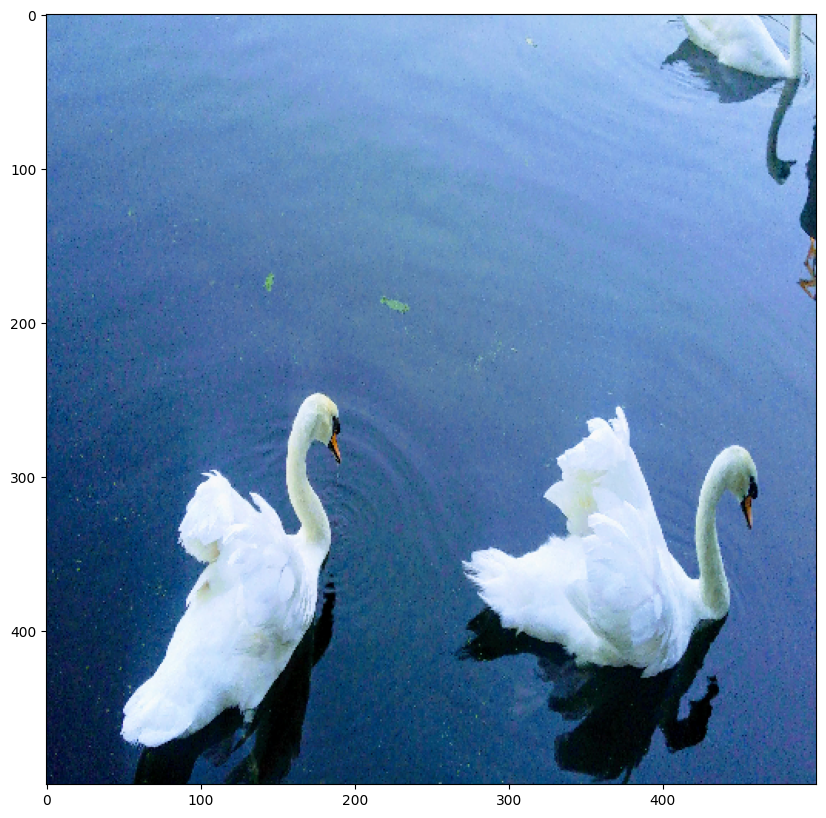

In [13]:
img=cv2.imread(path)
img=cv2.cvtColor(src=img,code=cv2.COLOR_BGR2RGB)
imgR=cv2.resize(img,(500,500))
plt.figure(figsize=(10,10))
plt.imshow(imgR)
plt.show()

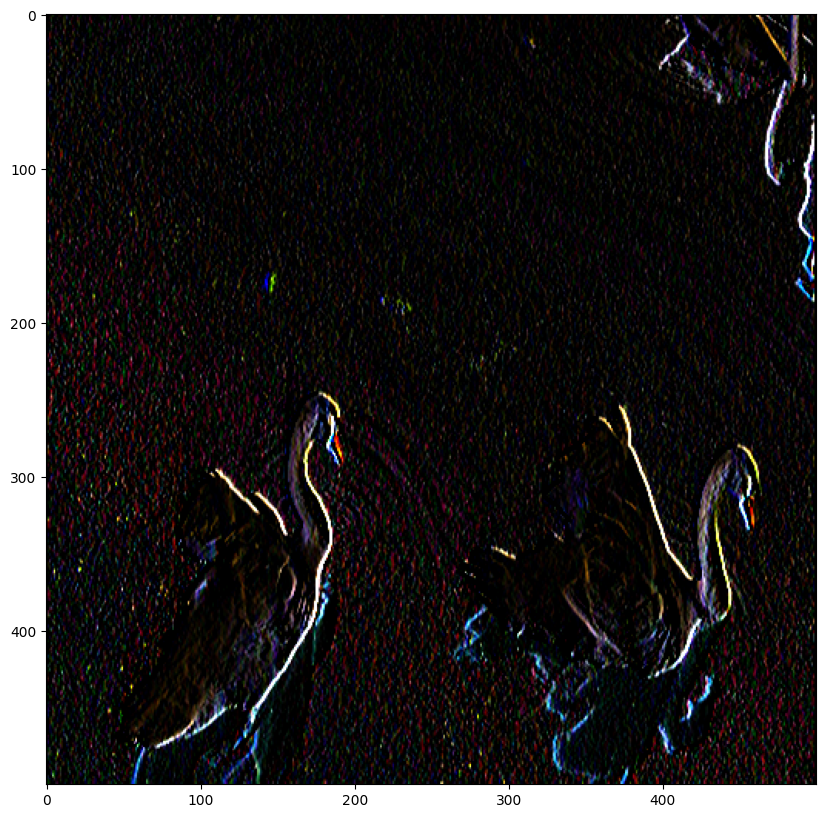

In [14]:
kernel=np.array([[1,0,-1],[2,0,-2],[1,0,-1]])
res=cv2.filter2D(imgR, -1,kernel)
plt.figure(figsize=(10,10))
plt.imshow(res)
plt.show()

# Visualizar filtros y rasgos en una red VGG16

Existen varias redes ya entrenadas, que pueden ser utilizadas. Por ejemplo VGG16 es una red entrenada para clasificar imágenes, fue entrenado sobre la base de datos ImageNet que tiene más de 15 millones de imágenes etiquetadas de alta resolución que pertenecen a aproximadamente 1000 categorías.

Las capas inferiores aprenden características de bajo nivel como esquinas, bordes, mientras que las capas medias aprenden color, forma, etc. y las capas superiores aprenden características de alto nivel que representan el objeto en la imagen.

In [27]:
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input, decode_predictions
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import tensorflow.keras.backend as K

In [28]:
model = VGG16(weights='imagenet')
model.summary()

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ fc1 (Dense)                          │ (None, 4096)                │     102,764,544 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 138,357,544 (527.79 MB)

 Trainable params: 138,357,544 (527.79 MB)

 Non-trainable params: 0 (0.00 B)

## Primera capa convolucional

Extraer la primera capa convolucional y obtener los pesos

In [34]:
first_conv_layer = model.get_layer('block1_conv1')
filters, biases = first_conv_layer.get_weights()

## Primer filtro

In [35]:
print("Primer filtro:\n", filters[:, :, :, 0])

Primer filtro:
 [[[ 0.42947057  0.55037946  0.4800154 ]
  [ 0.373467    0.44007453  0.4085474 ]
  [-0.06136011 -0.08138704 -0.06514555]]

 [[ 0.27476987  0.34573907  0.31047726]
  [ 0.03868078  0.04063221  0.05020237]
  [-0.36722335 -0.4535013  -0.40338343]]

 [[-0.05746817 -0.05863491 -0.05087169]
  [-0.26224968 -0.33066967 -0.2852275 ]
  [-0.35009676 -0.4850302  -0.41851634]]]


## Cargar una imagen en el tamaño que admite la red

In [51]:
path='/content/drive/MyDrive/Fotos_Pruebas/cisneNegro.jpg'

In [66]:
img = load_img(path)

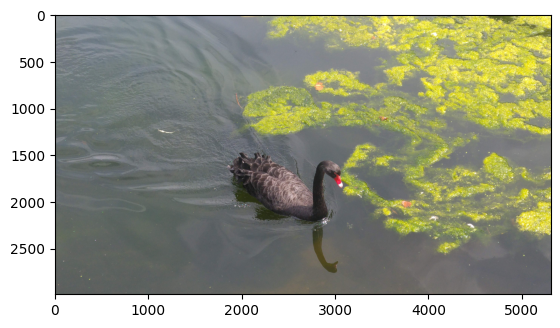

In [67]:
plt.imshow(img)

## Procesar la imagen

In [69]:
img = load_img(path, target_size=(224, 224))
img_array = img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)  # Añadir dimensión batch
img_array = preprocess_input(img_array)

## Cortar el modelo para que devuelva la primera capa

In [57]:
intermediate_model = tf.keras.Model(inputs=model.input, outputs=first_conv_layer.output)
feature_maps = intermediate_model.predict(img_array)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


## Visualizar el mapa de características correspondientes al primer filtro

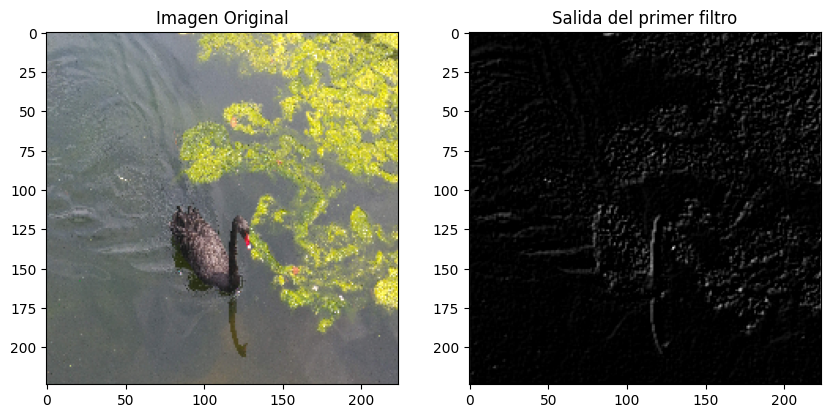

In [58]:
plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.title("Imagen Original")
plt.imshow(img)

plt.subplot(1, 2, 2)
plt.title("Salida del primer filtro")
plt.imshow(feature_maps[0, :, :, 0], cmap='gray')
plt.show()

## Ver todas las salidas de la primera capa

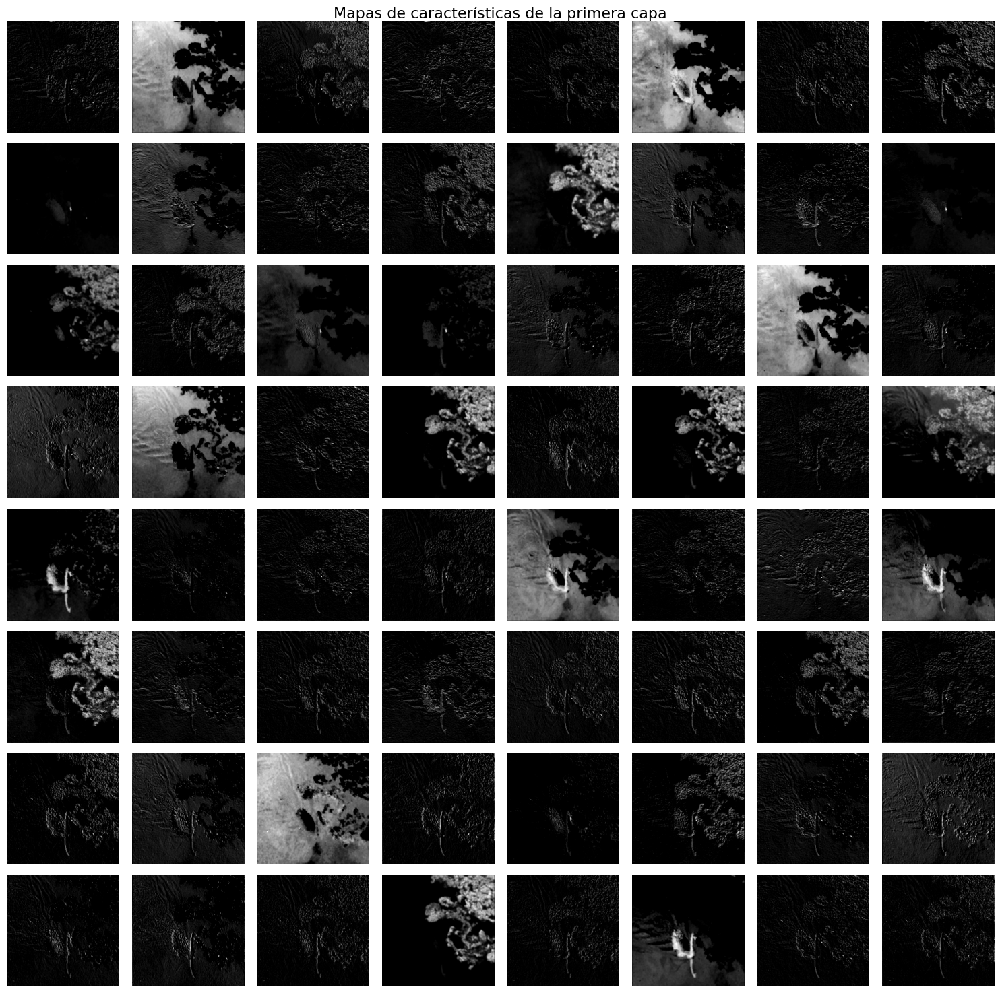

In [59]:
fig, axes = plt.subplots(8, 8, figsize=(15, 15))
for i in range(64):
  ax = axes[i // 8, i % 8]
  ax.imshow(feature_maps[0, :, :, i], cmap='gray')
  ax.axis('off')
plt.suptitle('Mapas de características de la primera capa', fontsize=16)
plt.tight_layout()
plt.show()

## Usar la red para predecir

In [60]:
preds=model.predict(img_array)
decode_predictions(preds, top=3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 805ms/step


[[('n01698640', 'American_alligator', 0.13971667),
  ('n01737021', 'water_snake', 0.075219475),
  ('n01860187', 'black_swan', 0.05518494)]]

In [46]:
decode_predictions(preds, top=1)

[[('n02009912', 'American_egret', 0.5852685)]]

In [61]:
with tf.GradientTape() as tape:
  last_conv_layer=model.get_layer('block5_conv3')
  iterate=tf.keras.models.Model([model.inputs],[model.output, last_conv_layer.output])
  model_out, last_conv_layer = iterate(img_array)
  class_out=model_out[:, np.argmax(model_out[0])]
  grads=tape.gradient(class_out, last_conv_layer)
  pooled_grads=K.mean(grads,axis=(0,1,2))

heatmap=tf.reduce_mean(tf.multiply(pooled_grads, last_conv_layer),axis=-1)

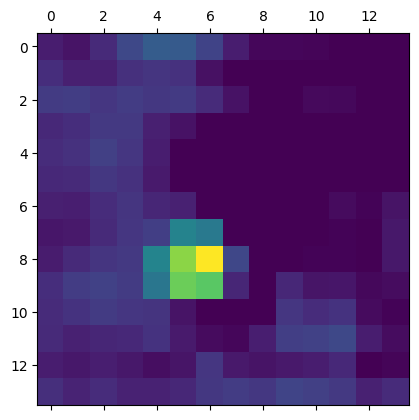

In [62]:
heatmap=np.maximum(heatmap, 0)
heatmap/=np.max(heatmap)
heatmap=heatmap.reshape((14,14))
plt.matshow(heatmap)
plt.show()

In [63]:
imgOrig=cv2.imread(path)
imgOrig.shape

(2988, 5312, 3)

In [64]:
scale_percent = 10
width = int(imgOrig.shape[1] * scale_percent / 100)
height = int(imgOrig.shape[0] * scale_percent / 100)
dim = (width, height)
img_resized = cv2.resize(imgOrig, dim, interpolation = cv2.INTER_AREA)
img_resized.shape

(298, 531, 3)

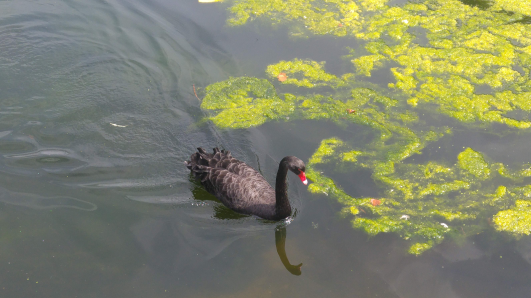

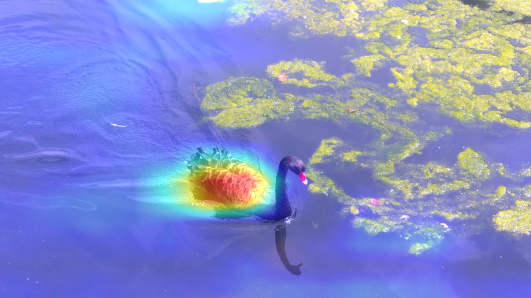

In [65]:
INTENSITY = 0.5
heatmap = cv2.resize(heatmap, (img_resized.shape[1],img_resized.shape[0]))
heatmap = cv2.applyColorMap(np.uint8(255*heatmap), cv2.COLORMAP_JET)
imgHM_1 = heatmap * 0.5 + img_resized
cv2_imshow(img_resized)
cv2_imshow(imgHM_1)

# Probar otro modelo para predecir

In [70]:
from tensorflow.keras.applications.inception_v3 import InceptionV3,preprocess_input,decode_predictions

In [71]:
model=InceptionV3(weights='imagenet')
model.summary()

96112376/96112376 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "inception_v3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3             │ (None, 299, 299, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 149, 149, 32)   │            864 │ input_layer_3[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 149, 149, 32)   │             96 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 149, 149, 32)   │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 147, 147, 32)   │          9,216 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 147, 147, 32)   │             96 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 147, 147, 32)   │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 147, 147, 64)   │         18,432 │ activation_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 147, 147, 64)   │            192 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 147, 147, 64)   │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 73, 73, 64)     │              0 │ activation_2[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 73, 73, 80)     │          5,120 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 73, 73, 80)     │            240 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, 73, 73, 80)     │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 71, 71, 192)    │        138,240 │ activation_3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 71, 71, 192)    │            576 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├──────────────────────

 Total params: 23,851,784 (90.99 MB)

 Trainable params: 23,817,352 (90.86 MB)

 Non-trainable params: 34,432 (134.50 KB)

In [72]:
img=load_img(path,target_size=(299,299))
x=img_to_array(img)
x=np.expand_dims(x,axis=0)
x=preprocess_input(x)

In [73]:
y=model.predict(x)
decode_predictions(y, top=3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


[[('n01860187', 'black_swan', 0.33862263),
  ('n02037110', 'oystercatcher', 0.12731786),
  ('n02018207', 'American_coot', 0.046181098)]]

In [74]:
def gradientModelDL (model,img,name_layer,imgOrig,n,scale_percent=100):
  with tf.GradientTape() as tape:
    last_conv_layer=model.get_layer(name_layer)
    iterate=tf.keras.models.Model([model.inputs],[model.output, last_conv_layer.output])
    model_out, last_conv_layer = iterate(img)
    class_out=model_out[:, np.argmax(model_out[0])]
    grads=tape.gradient(class_out, last_conv_layer)
    pooled_grads=K.mean(grads,axis=(0,1,2))

  #Disminuir la imagen
  width = int(imgOrig.shape[1] * scale_percent / 100)
  height = int(imgOrig.shape[0] * scale_percent / 100)
  dim = (width, height)
  img_resized = cv2.resize(imgOrig, dim, interpolation = cv2.INTER_AREA)
  heatmap=tf.reduce_mean(tf.multiply(pooled_grads, last_conv_layer),axis=-1)
  heatmap=np.maximum(heatmap, 0)
  heatmap/=np.max(heatmap)
  heatmap=heatmap.reshape((n,n))
  INTENSITY = 0.5
  heatmap = cv2.resize(heatmap, (img_resized.shape[1],img_resized.shape[0]))
  heatmap = cv2.applyColorMap(np.uint8(255*heatmap), cv2.COLORMAP_JET)
  imgHM = heatmap * INTENSITY + img_resized
  return img_resized,imgHM

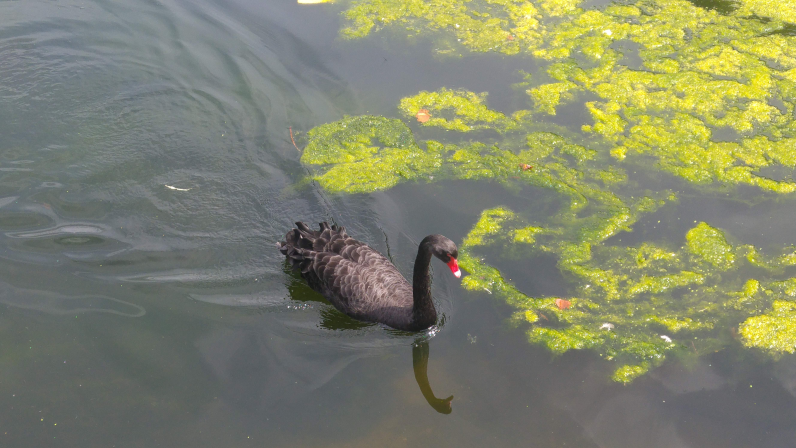

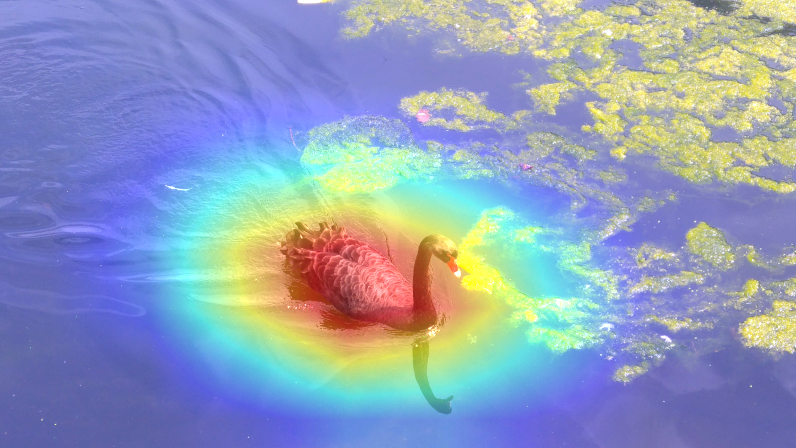

In [75]:
name_layer='mixed10'
n=8
img_resized,imgHM=gradientModelDL(model,x,name_layer, imgOrig, n, 15)
cv2_imshow(img_resized)
cv2_imshow(imgHM)